# Visualization and distance computation in SE(3): Application to structural bioinformatics

## Assoulant Justine, Dumercq Margot

## Importer les données


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
import plotly.graph_objects as go

# Spécifier le chemin du fichier Excel
path= '/home/dumercq/5GMM/projet/Données1_projet.xlsx'
path2= '/home/dumercq/5GMM/projet/Données2_projet.xlsx'

# Charger le fichier Excel dans un DataFrame
df = pd.read_excel(path)
df2 = pd.read_excel(path2)

# Remplacez le nom du DataFrame et de la colonne par les vôtres
df['vec1'] = df['vec1'].apply(lambda x: [float(i) for i in x.split(',')])
df['vec2'] = df['vec2'].apply(lambda x: [float(i) for i in x.split(',')])
df['vec3'] = df['vec3'].apply(lambda x: [float(i) for i in x.split(',')])
df['points'] = df['points'].apply(lambda x: [float(i) for i in x.split(',')])


# Remplacez le nom du DataFrame et de la colonne par les vôtres
df2['vec1'] = df2['vec1'].apply(lambda x: [float(i) for i in x.split(',')])
df2['vec2'] = df2['vec2'].apply(lambda x: [float(i) for i in x.split(',')])
df2['vec3'] = df2['vec3'].apply(lambda x: [float(i) for i in x.split(',')])
df2['points'] = df2['points'].apply(lambda x: [float(i) for i in x.split(',')])



In [30]:
#%matplotlib notebook

# Nuages de  points


### Protéine 1

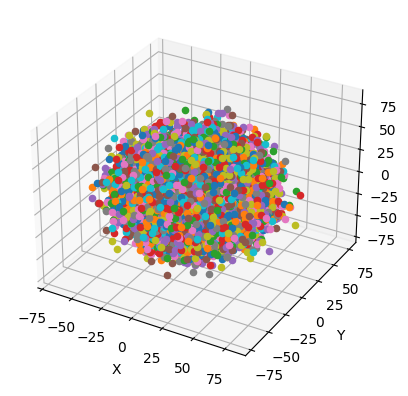

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Créer une figure 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Parcourir chaque ligne du DataFrame
for index, row in df.iterrows():
    # Extraire les coordonnées (x, y, z) et exclure le dernier élément
    x, y, z = row['points'][:-1]

    # Tracer le point
    ax.scatter(x, y, z)

# Ajouter des étiquettes aux axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Afficher le graphique
plt.show()

### Protéine 2

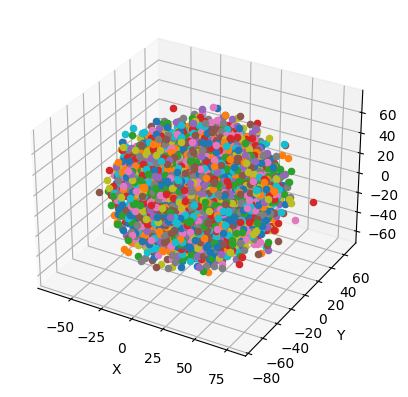

In [3]:

# Créer une figure 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Parcourir chaque ligne du DataFrame
for index, row in df2.iterrows():
    # Extraire les coordonnées (x, y, z) et exclure le dernier élément
    x, y, z = row['points'][:-1]

    # Tracer le point
    ax.scatter(x, y, z)

# Ajouter des étiquettes aux axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Afficher le graphique
plt.show()

# # Fonctions voxel

In [2]:
def dim_voxel(df):
    x = df['points'].apply(lambda x: x[0])
    dim_1=np.ceil(max(np.abs(x.min()),np.abs(x.max())))
    
    y = df['points'].apply(lambda x: x[1])
    dim_2=np.ceil(max(np.abs(y.min()),np.abs(y.max())))
    
    z = df['points'].apply(lambda x: x[2])
    dim_3=np.ceil(max(np.abs(z.min()),np.abs(z.max())))
    
    return int(dim_1),int(dim_2),int(dim_3)

In [3]:
def create_empty_voxel_map(dim_1,dim_2,dim_3):
    voxel_dimensions = (dim_1, dim_2, dim_3)
    voxel_map = np.empty(voxel_dimensions, dtype=object)
    return voxel_map
    

In [4]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

def draw_cube(ax, corners,color_edges,colo,alph):
    # Définir les faces du cube
    faces = [
        [corners[0], corners[4], corners[6], corners[2]],
        [corners[1], corners[5], corners[7], corners[3]],
        [corners[0], corners[4], corners[5], corners[1]],
        [corners[6], corners[2], corners[3], corners[7]],
        [corners[4], corners[6], corners[7], corners[5]],
        [corners[0], corners[2], corners[3], corners[2]]
    ]

    # Ajouter les faces du cube à la figure
    ax.add_collection3d(Poly3DCollection(faces, facecolors=colo, linewidths=1, edgecolors=color_edges, alpha=alph))


In [5]:
def vox_size(l_points):
    vox_si=True
    
    for i in range(len(l_points)):
        if len(l_points[i])==1:
            vox_si=False
            break
    return vox_si

In [6]:
def creation_voxel_liste(df,voxel_size):
    dim1,dim2,dim3=dim_voxel(df)
    m=0
    n=0
    q=0
    l_index=[]
    l_points=[]
    df['points'] = df['points'].apply(lambda x: x[:3])
    for x in range(-dim1,dim1,voxel_size):
        n=0
        for y in range(-dim2,dim2,voxel_size):
            q=0
            for z in range(-dim3,dim3,voxel_size):
                filtered_points = df[df['points'].apply(lambda point: x <= point[0] < x + voxel_size and
                                                            y <= point[1] < y + voxel_size and
                                                            z <= point[2] < z + voxel_size)]

                if not(filtered_points.empty):
                    l_index.append((m,n,q))
                    l_points.append(filtered_points['points'].tolist())
                q+=1
            n+=1
        m+=1
    # prepare some coordinates
    x, y, z = np.indices((dim1*2,dim2*2,dim3*2))
    voxel=[]
    for i in range(np.shape(l_index)[0]):
        voxel.append((x > l_index[i][0]*voxel_size)& (x<l_index[i][0]*voxel_size+voxel_size) & (y > l_index[i][1]*voxel_size)& (y<l_index[i][1]*voxel_size+voxel_size) & (z > l_index[i][2]*voxel_size)&(z<l_index[i][2]*voxel_size+voxel_size))

    return voxel,l_index,l_points


In [7]:
def creation_voxel_liste_opt(df,init):
    dim1,dim2,dim3=dim_voxel(df)
    voxel_size=init #a définir 
    m=0
    n=0
    q=0
    l_index=[]
    l_points=[]
    df['points'] = df['points'].apply(lambda x: x[:3])
    cond=False
    while cond==False:
        voxel_size+=1
        l_index=[]
        l_points=[]
        m=0
        n=0
        q=0
        for x in range(-dim1,dim1,voxel_size):
            n=0
            for y in range(-dim2,dim2,voxel_size):
                q=0
                for z in range(-dim3,dim3,voxel_size):
                    filtered_points = df[df['points'].apply(lambda point: x <= point[0] < x + voxel_size and
                                                                y <= point[1] < y + voxel_size and
                                                                z <= point[2] < z + voxel_size)]
                    if not(filtered_points.empty):
                        l_index.append((m,n,q))
                        l_points.append(filtered_points['points'].tolist())
                    q+=1
                n+=1
            m+=1
        cond=vox_size(l_points)
        # prepare some coordinates
        x, y, z = np.indices((dim1*2,dim2*2,dim3*2))

        voxel=[]
        for i in range(np.shape(l_index)[0]):
            voxel.append((x > l_index[i][0]*voxel_size)& (x<l_index[i][0]*voxel_size+voxel_size) & (y > l_index[i][1]*voxel_size)& (y<l_index[i][1]*voxel_size+voxel_size) & (z > l_index[i][2]*voxel_size)&(z<l_index[i][2]*voxel_size+voxel_size))

    return voxel,l_index,l_points,voxel_size

In [8]:
def afficher_voxel_map(df,voxel_liste,voxel_size):
    dim1,dim2,dim3=dim_voxel(df)
    size=(dim1*2,dim2*2,dim3*2)


    cube_init=np.array([[0, 0, 0],
                     [0, 0, voxel_size-1],
                     [0, voxel_size-1, 0],
                     [0, voxel_size-1, voxel_size-1],
                     [voxel_size-1, 0, 0],
                     [voxel_size-1, 0, voxel_size-1],
                     [voxel_size-1, voxel_size-1, 0],
                     [voxel_size-1, voxel_size-1, voxel_size-1]])


    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    # Itérer à travers chaque cube dans la liste et mettre à jour le voxelarray
    for cube_condition in voxel_liste:
        cube_condition = np.array(cube_condition)
        draw_cube(ax, cube_init+np.argwhere(cube_condition)[0],'black','white',0.1)

    ax.set_xlim([0, dim1*2])
    ax.set_ylim([0, dim2*2])
    ax.set_zlim([0, dim3*2])
    fig.set_size_inches(10, 10) 

    # Afficher la figure
    plt.show()                          


In [9]:
def draw_cube_orientation(ax, corners,nb,color_edges,colo,k,q1,q3=None):


    faces = [
        [corners[0], corners[4], corners[6], corners[2]],
        [corners[1], corners[5], corners[7], corners[3]],
        [corners[0], corners[4], corners[5], corners[1]],
        [corners[6], corners[2], corners[3], corners[7]],
        [corners[4], corners[6], corners[7], corners[5]],
        [corners[0], corners[2], corners[3], corners[2]]
    ]

    # Ajouter les faces du cube à la figure
    if nb[k]<q1:
        ax.add_collection3d(Poly3DCollection(faces, facecolors=colo, linewidths=0.5, edgecolors=color_edges, alpha=0.1))
    elif q1 <=nb[k]<=q3:
        ax.add_collection3d(Poly3DCollection(faces, facecolors=colo, linewidths=0.5, edgecolors=color_edges, alpha=0.5))
    elif nb[k]>q3:
        ax.add_collection3d(Poly3DCollection(faces, facecolors=colo, linewidths=0.5, edgecolors=color_edges, alpha=1))


In [10]:
voxel_size=10
cube_init=np.array([[0, 0, 0],
                 [0, 0, voxel_size-1],
                 [0, voxel_size-1, 0],
                 [0, voxel_size-1, voxel_size-1],
                 [voxel_size-1, 0, 0],
                 [voxel_size-1, 0, voxel_size-1],
                 [voxel_size-1, voxel_size-1, 0],
                 [voxel_size-1, voxel_size-1, voxel_size-1]])

In [11]:
from scipy.spatial.transform import Rotation as R
from pyquaternion import Quaternion

def moy_dist_voxel(df, l_points) :
    points_list = df['points'].tolist() #je convertis la colonne 'points' en une liste d'array
    index_element = []

    points_dans_voxel=[]
    for i in l_points :
        points_dans_voxel.append(i)

    liste=[]

    for points_voxel in points_dans_voxel:
        ind=[]
        for points in points_voxel :
            # Trouver l'index de l'élément dans la liste
            for index, array in enumerate(points_list):
                if np.array_equal(array, points):
                    index_element.append(index)
                    ind.append(index)

        liste.append(ind)
       
    #Calcul de toutes les matrices de rotaion :
    rotation_matrix = []
    for l in liste :
        rot=[]
        for i in l :
            rot.append(np.column_stack((df['vec1'][i][:-1],df['vec2'][i][:-1],df['vec3'][i][:-1])))
        rotation_matrix.append(rot)
       
    #quaternion correspondant :
    q=[]
    for i in rotation_matrix :
        quat=[]
        for rot in i :
            r=R.from_matrix(rot)
            quat.append(r.as_quat())
        q.append(quat)
       
    #calcul distance
    #si il n'y a qu'un point on met la distance à 0
    distance=[]
    for i in range(len(liste)):
        if len(liste[i])==1 :
            distance.append(0)
        else :  
            dist=np.zeros((len(q[i]),len(q[i])))
            for q1 in range(len(q[i])):
                for q2 in range(q1+1, len(q[i])):
                    abs_dist=Quaternion.absolute_distance(Quaternion(q[i][q1]),Quaternion(q[i][q2]))
                    dist[q1, q2] = abs_dist
                    dist[q2, q1] = abs_dist
            distance.append(dist)
   
    #moyenne
    moyenne=[]
    for d in distance :
        moyenne.append(np.mean(d))
   
    return moyenne, q

In [12]:
def sous_voxel(moyenne, quantiles, l_index, voxel_size, df) :
    dim1, dim2, dim3= dim_voxel(df)
    # Je sépare en 3 sous suites selon les quantiles 25% et 75%
    moyenne_inf_25 = [val for val in moyenne if val < quantiles[0]]
    moyenne_inter_25_75 = [val for val in moyenne if quantiles[0] <= val <= quantiles[2]]
    moyenne_sup_75 = [val for val in moyenne if val > quantiles[2]]
   
    # J'extraie les indices des 3 sous suites des indices
    index_inf_25 = [index for index, valeur in enumerate(moyenne) if valeur < quantiles[0]]
    index_inter_25_75 = [index for index, valeur in enumerate(moyenne) if (quantiles[0] <= valeur <= quantiles[2])]
    index_sup_75 = [index for index, valeur in enumerate(moyenne) if valeur > quantiles[2]]
   
    #sous listes d'indices de l_index
    l_index_25 = []
    l_index_25_75 = []
    l_index_75 = []

    for i in index_inf_25 :
        l_index_25.append(l_index[i])

    for i in index_inter_25_75 :
        l_index_25_75.append(l_index[i])

    for i in index_sup_75 :
        l_index_75.append(l_index[i])
       
    x, y, z = np.indices((dim1*2,dim2*2,dim3*2))

    voxel_25=[]
    voxel_25_75=[]
    voxel_75=[]

    for i in range(np.shape(l_index_25)[0]):
        voxel_25.append((x > l_index_25[i][0]*voxel_size)& (x<l_index_25[i][0]*voxel_size+voxel_size)
                        & (y > l_index_25[i][1]*voxel_size)& (y<l_index_25[i][1]*voxel_size+voxel_size)
                        & (z > l_index_25[i][2]*voxel_size)&(z<l_index_25[i][2]*voxel_size+voxel_size))

    for i in range(np.shape(l_index_25_75)[0]):
        voxel_25_75.append((x > l_index_25_75[i][0]*voxel_size)& (x<l_index_25_75[i][0]*voxel_size+voxel_size)
                        & (y > l_index_25_75[i][1]*voxel_size)& (y<l_index_25_75[i][1]*voxel_size+voxel_size)
                        & (z > l_index_25_75[i][2]*voxel_size)&(z<l_index_25_75[i][2]*voxel_size+voxel_size))

    for i in range(np.shape(l_index_75)[0]):
        voxel_75.append((x > l_index_75[i][0]*voxel_size)& (x<l_index_75[i][0]*voxel_size+voxel_size)
                        & (y > l_index_75[i][1]*voxel_size)& (y<l_index_75[i][1]*voxel_size+voxel_size)
                        & (z > l_index_75[i][2]*voxel_size)&(z<l_index_75[i][2]*voxel_size+voxel_size))
   
    return voxel_25, voxel_25_75, voxel_75,index_inf_25,index_inter_25_75,index_sup_75
   


In [13]:
def afficher_ssvoxel_col (voxel_25, voxel_25_75, voxel_75, df) :
    dim1, dim2, dim3= dim_voxel(df)
    c3=[]
    for cube_condition in voxel_75:
        cube_condition = np.array(cube_condition)
        c3.append(np.argwhere(cube_condition)[0])

    c2=[]
    for cube_condition in voxel_25_75:
        cube_condition = np.array(cube_condition)
        c2.append(np.argwhere(cube_condition)[0])

    c1=[]
    for cube_condition in voxel_25:
        cube_condition = np.array(cube_condition)
        c1.append(np.argwhere(cube_condition)[0])

    dim1,dim2,dim3=dim_voxel(df)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    for cube_condition in c3:
        draw_cube(ax, cube_init+cube_condition,'red','red',0.1)

    for cube_condition in c1:
        draw_cube(ax, cube_init+cube_condition,'blue','blue',0.1)  

    for cube_condition in c2:
        draw_cube(ax, cube_init+cube_condition,'yellow','yellow',0.1)

    ax.set_xlim([0, dim1*2])
    ax.set_ylim([0, dim2*2])
    ax.set_zlim([0, dim3*2])
    fig.set_size_inches(10, 10)

    # Afficher la figure
    plt.show() 
    
    return c1,c2,c3



In [14]:
def ss_ss_voxel(voxel,n,q1,q3):
    c1=[]
    c2=[]
    c3=[]
    k=0
    for cube_condition in voxel:
        if n[k]<q1:
            cube_condition = np.array(cube_condition)
            c1.append(np.argwhere(cube_condition)[0])
        elif q1 <=n[k]<=q3:
            cube_condition = np.array(cube_condition)
            c2.append(np.argwhere(cube_condition)[0])    
        elif n[k]>q3:    
            cube_condition = np.array(cube_condition)
            c3.append(np.argwhere(cube_condition)[0])    
        k+=1
    return c1,c2,c3


In [15]:
def aff_diff(c1,c2):
    arrays_communs = []

    # Comparaison des arrays
    for arr_c1 in c1:
        for arr_c2 in c2:
            if np.array_equal(arr_c1, arr_c2):
                arrays_communs.append(arr_c1)

    # Convertir les listes en ensembles d'arrays
    ensemble1 = set(map(tuple, c1))
    ensemble2 = set(map(tuple, c2))

    # Obtenir les arrays présents uniquement dans la première liste
    resultat = ensemble1 - ensemble2

    # Convertir l'ensemble en liste d'arrays
    c1_unique = [np.array(arr) for arr in resultat]

    # Obtenir les arrays présents uniquement dans la première liste
    resultat = ensemble2 - ensemble1

    # Convertir l'ensemble en liste d'arrays
    c2_unique = [np.array(arr) for arr in resultat]
    dim1,dim2,dim3=dim_voxel(df)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')


    for cube_condition in arrays_communs:
        draw_cube(ax, cube_init+cube_condition,'black','white',0.1)

    for cube_condition in c1_unique:
        draw_cube(ax, cube_init+cube_condition,'purple','purple',0.1)  

    for cube_condition in c2_unique:
        draw_cube(ax, cube_init+cube_condition,'green','green',0.1) 

    ax.set_xlim([0, dim1*2])
    ax.set_ylim([0, dim2*2])
    ax.set_zlim([0, dim3*2])
    fig.set_size_inches(10, 10) 

    # Afficher la figure
    plt.show() 

#  Voxel map prot 1

## Discrétisation avec un voxel_size qui est défini de sorte à ce que chaque voxel soit composé d'au moins 2 conformations

In [16]:
voxel_1_opt,l_index_1_opt,l_points_1_opt,voxel_size_opt=creation_voxel_liste_opt(df,50)

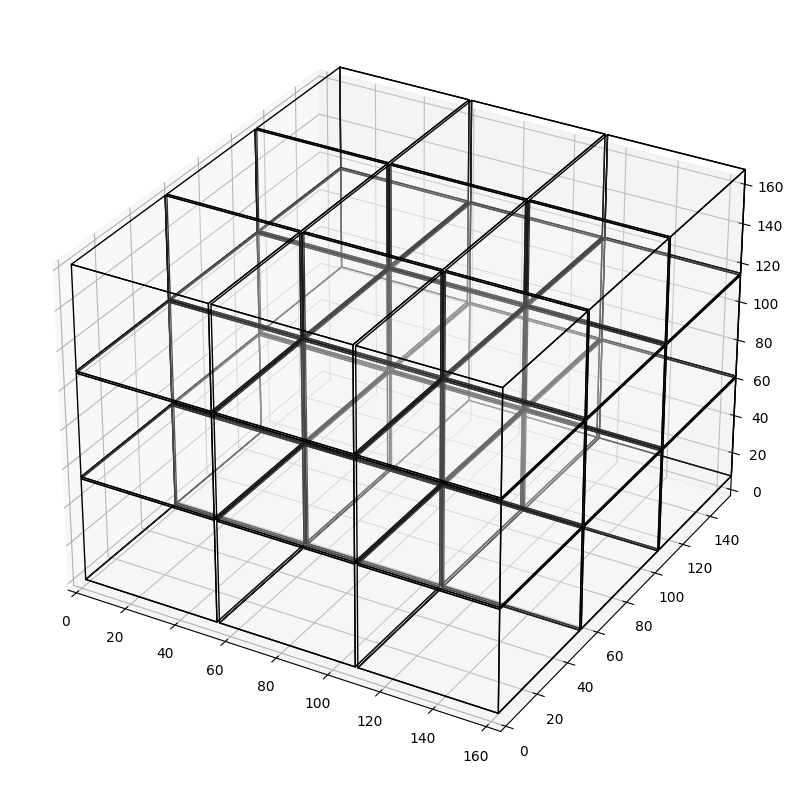

In [17]:
afficher_voxel_map(df,voxel_1_opt,voxel_size_opt)

## Discrétisation avec un voxel_size arbitraire

In [18]:
voxel_1,l_index_1,l_points_1=creation_voxel_liste(df,10)

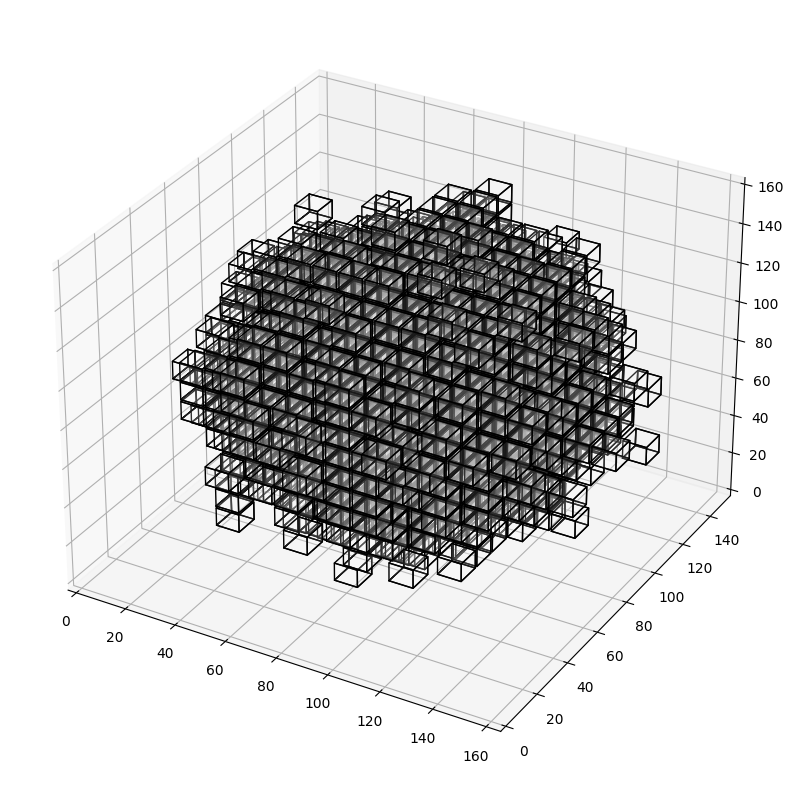

In [19]:
afficher_voxel_map(df,voxel_1,10)

#  Voxel map prot2

## Discrétisation avec un voxel_size qui est défini de sorte à ce que chaque voxel soit composé d'au moins 2 conformations

In [20]:
voxel_2_opt,l_index_2_opt,l_points_2_opt,voxel_size_opt=creation_voxel_liste_opt(df2,50)

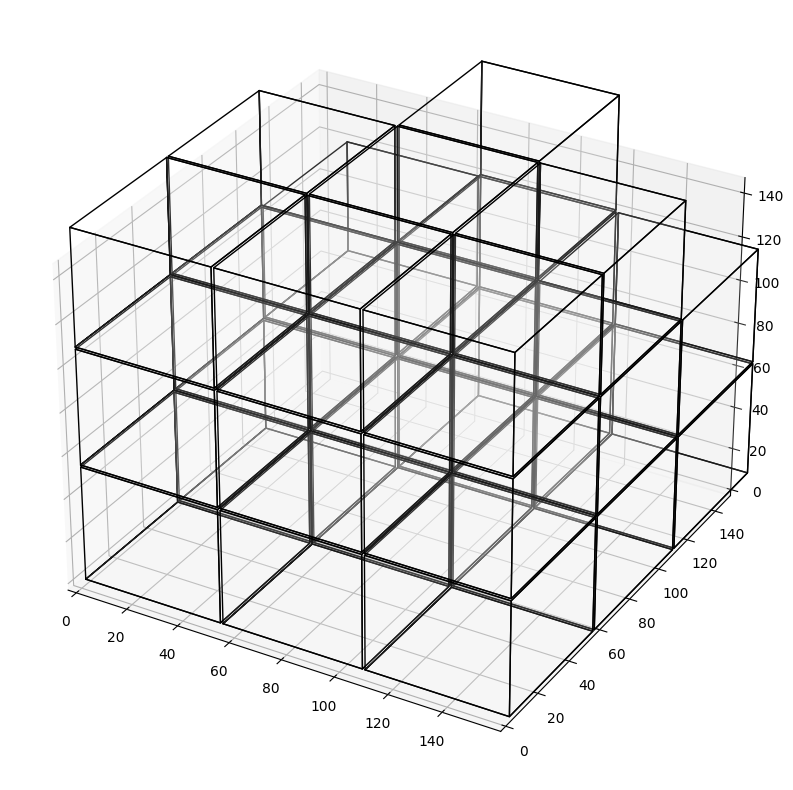

In [21]:
afficher_voxel_map(df2,voxel_2_opt,voxel_size_opt)

## Discrétisation avec un voxel_size arbitraire

In [22]:
voxel_2,l_index_2,l_points_2=creation_voxel_liste(df2,10)

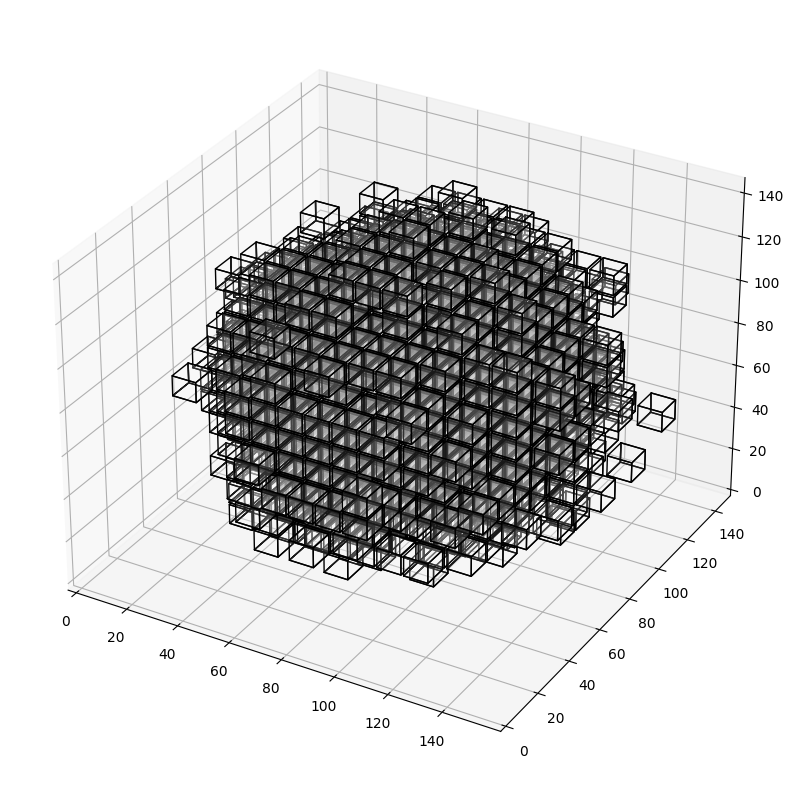

In [23]:
afficher_voxel_map(df2,voxel_2,10)

# Afficher les deux protéines

### Différences des deux

In [24]:
dim1,dim2,dim3=dim_voxel(df)


c2=[]
for cube_condition in voxel_2:
    cube_condition = np.array(cube_condition)
    c2.append(np.argwhere(cube_condition)[0])

c1=[]
for cube_condition in voxel_1:
    cube_condition = np.array(cube_condition)
    c1.append(np.argwhere(cube_condition)[0])
            

In [25]:
arrays_communs = []

# Comparaison des arrays
for arr_c1 in c1:
    for arr_c2 in c2:
        if np.array_equal(arr_c1, arr_c2):
            arrays_communs.append(arr_c1)



In [26]:
# Convertir les listes en ensembles d'arrays
ensemble1 = set(map(tuple, c1))
ensemble2 = set(map(tuple, c2))

# Obtenir les arrays présents uniquement dans la première liste
resultat = ensemble1 - ensemble2

# Convertir l'ensemble en liste d'arrays
c1_unique = [np.array(arr) for arr in resultat]

# Obtenir les arrays présents uniquement dans la première liste
resultat = ensemble2 - ensemble1

# Convertir l'ensemble en liste d'arrays
c2_unique = [np.array(arr) for arr in resultat]

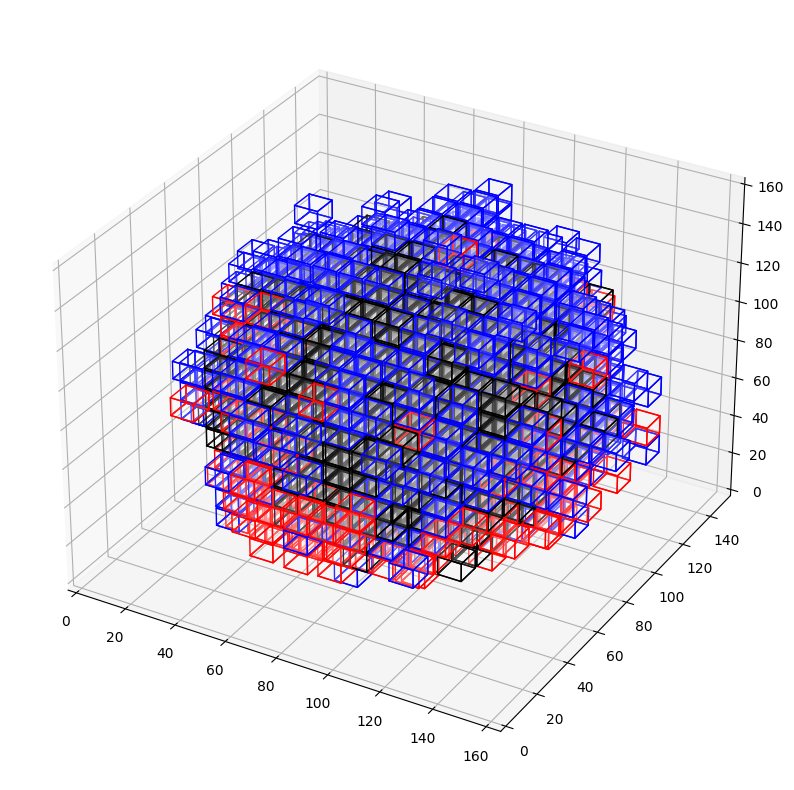

In [27]:
dim1,dim2,dim3=dim_voxel(df)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')


for cube_condition in arrays_communs:
    draw_cube(ax, cube_init+cube_condition,'black','white',0.1)

for cube_condition in c1_unique:
    draw_cube(ax, cube_init+cube_condition,'blue','white',0.1)  

for cube_condition in c2_unique:
    draw_cube(ax, cube_init+cube_condition,'red','white',0.1) 
    
ax.set_xlim([0, dim1*2])
ax.set_ylim([0, dim2*2])
ax.set_zlim([0, dim3*2])
fig.set_size_inches(10, 10) 

# Afficher la figure
plt.show()  

# Fusion des deux data frame

In [28]:
liste_concat = [df, df2]
df_fusion=pd.concat(liste_concat)
df_fusion = df_fusion.reset_index(drop=True) # pour que les numéros des lignes soient de 0 à 19999

In [29]:
voxel_fusion,l_index_fusion,l_points_fusion=creation_voxel_liste(df_fusion,10)

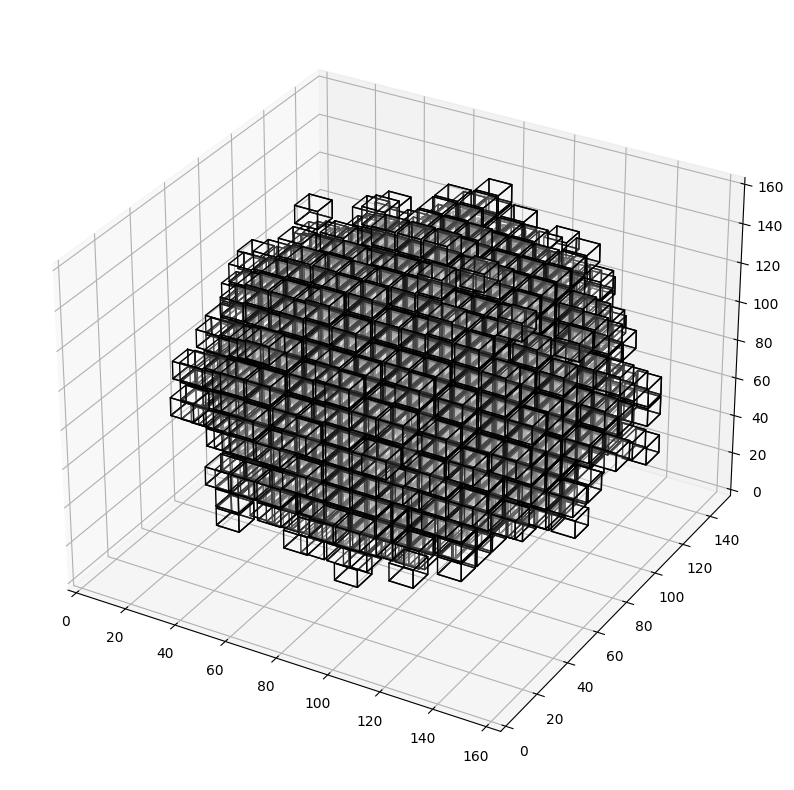

In [30]:
afficher_voxel_map(df_fusion,voxel_fusion,10)

In [20]:
#moyenne_fusion,q_fusion=moy_dist_voxel(df_fusion,l_points_fusion)

In [24]:
#import pickle 
#with open('moyenne_fusion.pk','wb') as fin :
 #   pickle.dump(moyenne_fusion,fin)

In [24]:
import pickle 
with open('moyenne_fusion.pk','rb') as fin : 
    moyenne_fusion=pickle.load(fin)

Text(0.5, 1.0, 'Histogramme de la distribution des moyennes sur toute la voxel map de la fusion des df')

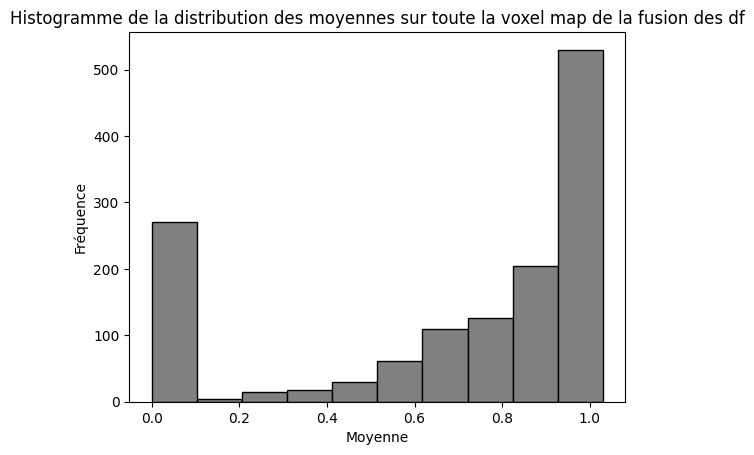

In [32]:
plt.hist(moyenne_fusion, bins=10, color='grey', edgecolor='black')
plt.xlabel('Moyenne')
plt.ylabel('Fréquence')
plt.title('Histogramme de la distribution des moyennes sur toute la voxel map de la fusion des df')

In [28]:
# Calcul des quantiles (25%, 50%, 75%)
quantiles_fusion = np.percentile(moyenne_fusion, [25, 50, 75])

print("Les quantiles sont :")
print(f"Q1 (25%) : {quantiles_fusion[0]}")
print(f"Q3 (75%) : {quantiles_fusion[2]}")

Les quantiles sont :
Q1 (25%) : 0.524480927924845
Q3 (75%) : 0.9798736439705246


# Quaternions prot1


In [28]:
#moyenne_1,q_1=moy_dist_voxel(df,l_points_1)

In [30]:
#with open('q_1.pk','wb') as f :
#    pickle.dump(q_1,f)

In [31]:
#with open('moyenne_1.pk','wb') as f :
#    pickle.dump(moyenne_1,f)

In [25]:
with open('moyenne_1.pk','rb') as fin : 
    moyenne_1=pickle.load(fin)

In [26]:
with open('q_1.pk','rb') as fin : 
    q_1=pickle.load(fin)

Text(0.5, 1.0, 'Histogramme de la distribution des moyennes sur toute la voxel map')

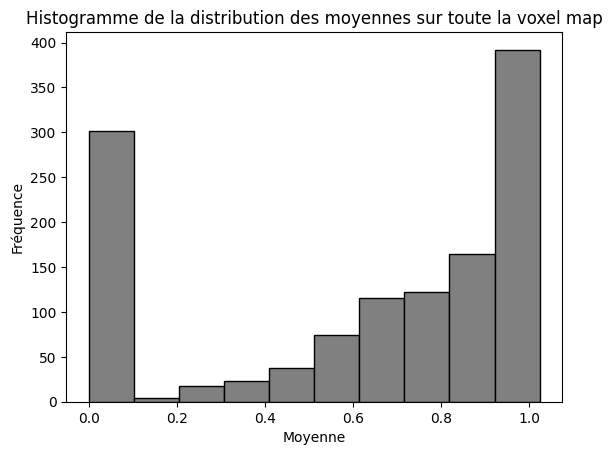

In [36]:
plt.hist(moyenne_1, bins=10, color='grey', edgecolor='black')
plt.xlabel('Moyenne')
plt.ylabel('Fréquence')
plt.title('Histogramme de la distribution des moyennes sur toute la voxel map')

In [29]:
voxel_25_1, voxel_25_75_1, voxel_75_1, index_inf_25_1,index_inter_25_75_1,index_sup_75_1 = sous_voxel(moyenne_1, quantiles_fusion, l_index_1, voxel_size, df)

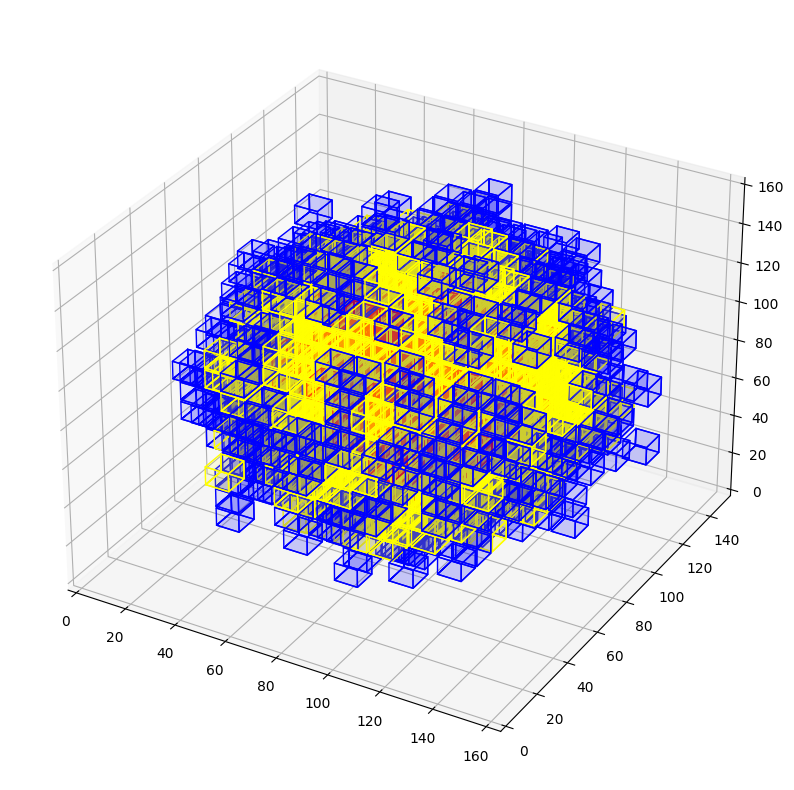

In [30]:
c1,c2,c3=afficher_ssvoxel_col(voxel_25_1, voxel_25_75_1, voxel_75_1, df)

### 1er quantile

In [31]:
n_25_1=[]
for i in range(len(index_inf_25_1)):
    n_25_1.append(len(q_1[moyenne_1.index(moyenne_1[index_inf_25_1[i]])]))

Text(0.5, 1.0, 'Histogramme de la distribution du nombre de point dans les voxels à faible orientation')

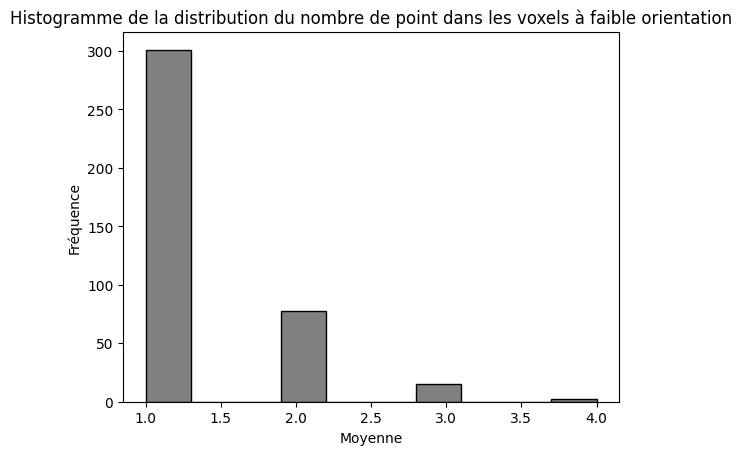

In [32]:
plt.hist(n_25_1, bins=10, color='grey', edgecolor='black')
plt.xlabel('Moyenne')
plt.ylabel('Fréquence')
plt.title('Histogramme de la distribution du nombre de point dans les voxels à faible orientation')

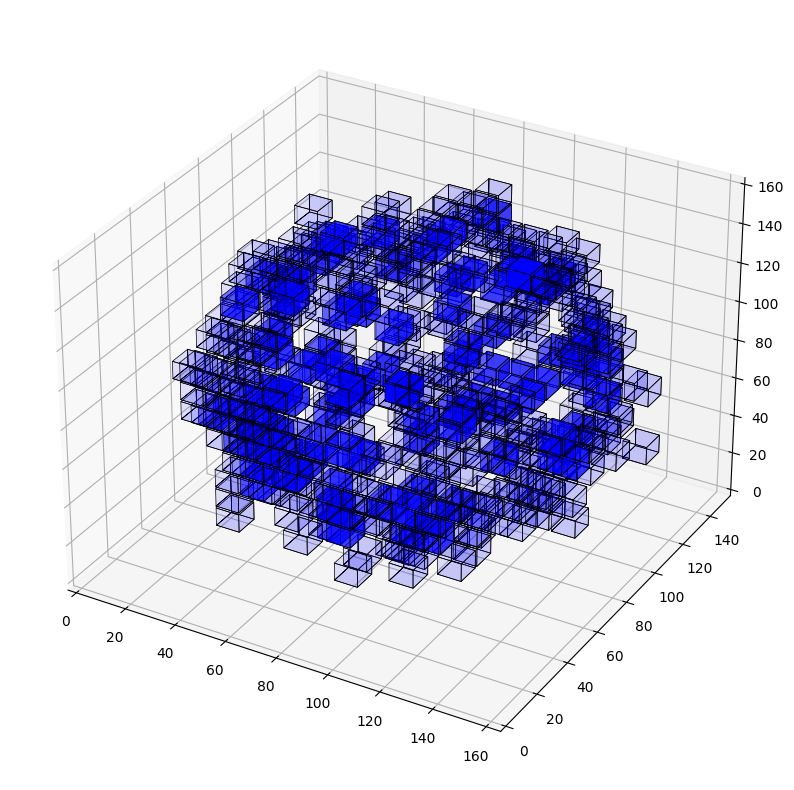

In [33]:
dim1,dim2,dim3=dim_voxel(df)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
k=0
for cube_condition in c1:
    
    draw_cube_orientation(ax, cube_init+cube_condition,n_25_1,'black','blue',k,1.01,3.01)
    k+=1

    
ax.set_xlim([0, dim1*2])
ax.set_ylim([0, dim2*2])
ax.set_zlim([0, dim3*2])
fig.set_size_inches(10, 10) 

# Afficher la figure
plt.show()  

### 2ème quantile

In [34]:
n_25_75_1=[]
for i in range(len(index_inter_25_75_1)):
    n_25_75_1.append(len(q_1[moyenne_1.index(moyenne_1[index_inter_25_75_1[i]])]))

Text(0.5, 1.0, 'Histogramme de la distribution du nombre de point dans les voxels à moyenne orientation')

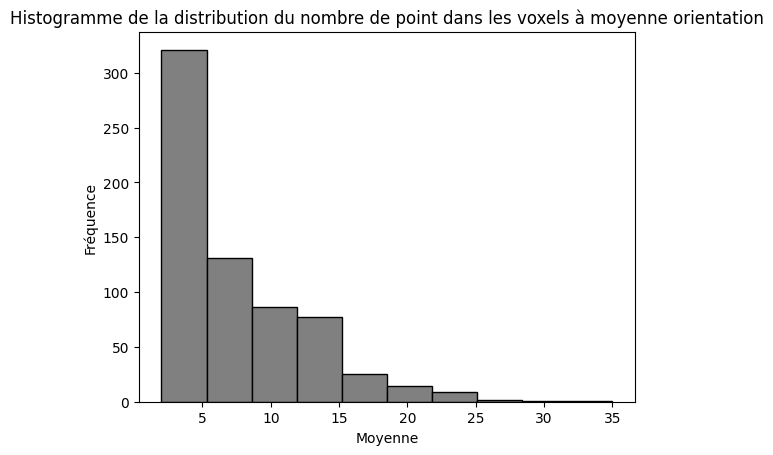

In [35]:
plt.hist(n_25_75_1, bins=10, color='grey', edgecolor='black')
plt.xlabel('Moyenne')
plt.ylabel('Fréquence')
plt.title('Histogramme de la distribution du nombre de point dans les voxels à moyenne orientation')

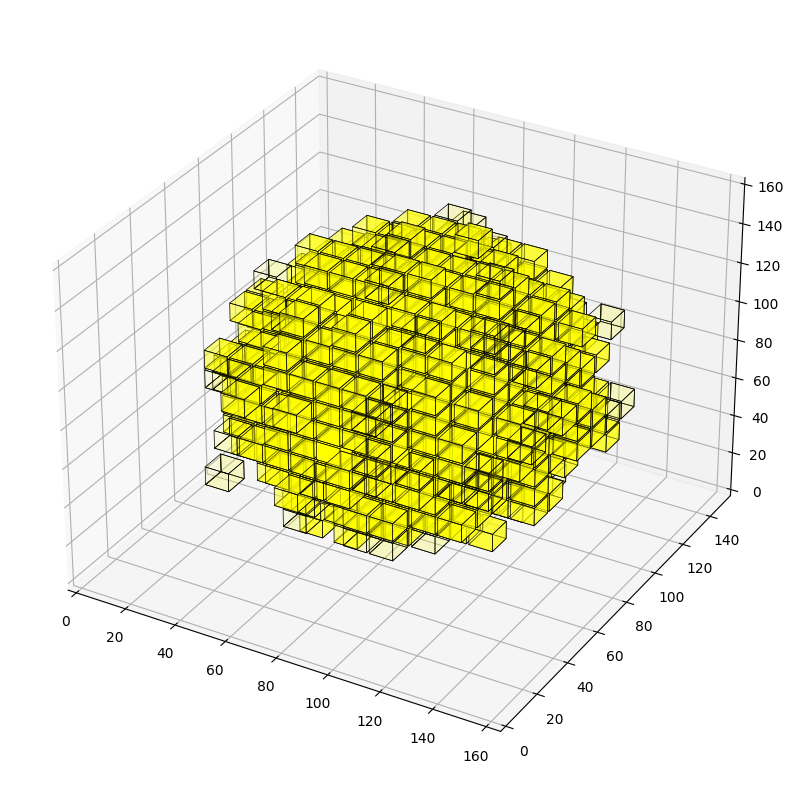

In [36]:
dim1,dim2,dim3=dim_voxel(df)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
k=0

quant1 = np.percentile(n_25_75_1, [25, 50, 75])[0]
quant3=np.percentile(n_25_75_1, [25, 50, 75])[2]
for cube_condition in c2:
    
    draw_cube_orientation(ax, cube_init+cube_condition,n_25_75_1,'black','yellow',k,quant1,quant3)
    k+=1

    
ax.set_xlim([0, dim1*2])
ax.set_ylim([0, dim2*2])
ax.set_zlim([0, dim3*2])
fig.set_size_inches(10, 10) 

# Afficher la figure
plt.show()  

### 3ème quantile

In [37]:
n_75_1=[]
for i in range(len(index_sup_75_1)):
    n_75_1.append(len(q_1[moyenne_1.index(moyenne_1[index_sup_75_1[i]])]))

Text(0.5, 1.0, 'Histogramme de la distribution du nombre de point dans les voxels à grande orientation')

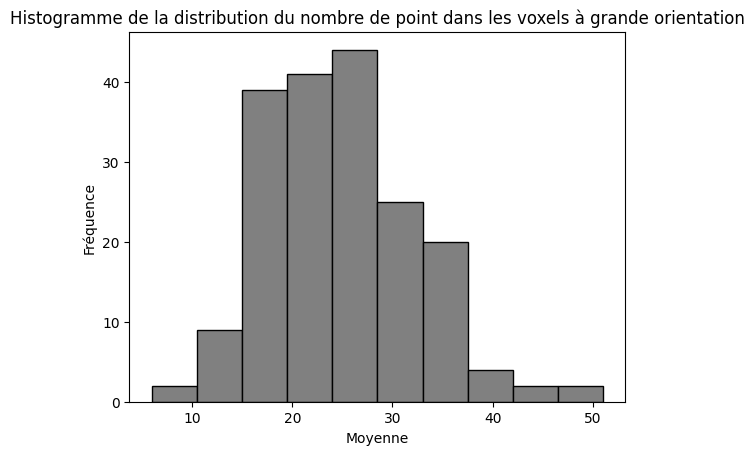

In [38]:
plt.hist(n_75_1, bins=10, color='grey', edgecolor='black')
plt.xlabel('Moyenne')
plt.ylabel('Fréquence')
plt.title('Histogramme de la distribution du nombre de point dans les voxels à grande orientation')

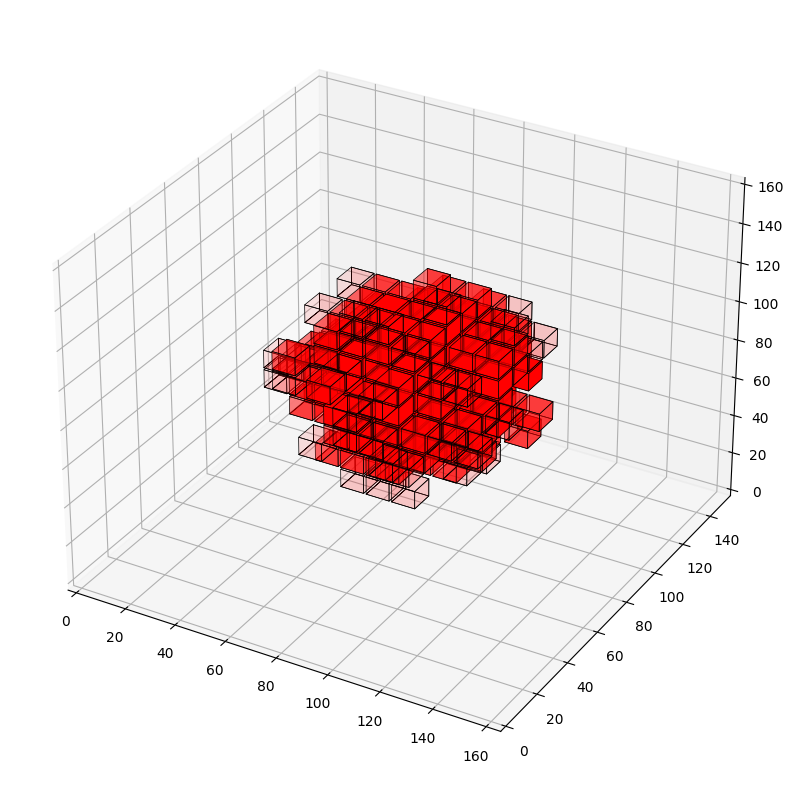

In [39]:
dim1,dim2,dim3=dim_voxel(df)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
k=0

quant1 = np.percentile(n_75_1, [25, 50, 75])[0]
quant3=np.percentile(n_75_1, [25, 50, 75])[2]
for cube_condition in c3:
    
    draw_cube_orientation(ax, cube_init+cube_condition,n_75_1,'black','red',k,quant1,quant3)
    k+=1

    
ax.set_xlim([0, dim1*2])
ax.set_ylim([0, dim2*2])
ax.set_zlim([0, dim3*2])
fig.set_size_inches(10, 10) 

# Afficher la figure
plt.show()  

# Quaternions prot2

In [40]:
#moyenne_2,q_2=moy_dist_voxel(df2,l_points_2)

In [41]:
#with open('moyenne_2.pk','wb') as F :
#    pickle.dump(moyenne_2,F)

In [ ]:
#with open('q_2.pk','wb') as F :
#    pickle.dump(q_2,F)

In [42]:
with open('moyenne_2.pk','rb') as fin : 
    moyenne_2=pickle.load(fin)

In [43]:
with open('q_2.pk','rb') as fin : 
    q_2=pickle.load(fin)

Text(0.5, 1.0, 'Histogramme de la distribution des moyennes sur toute la voxel map')

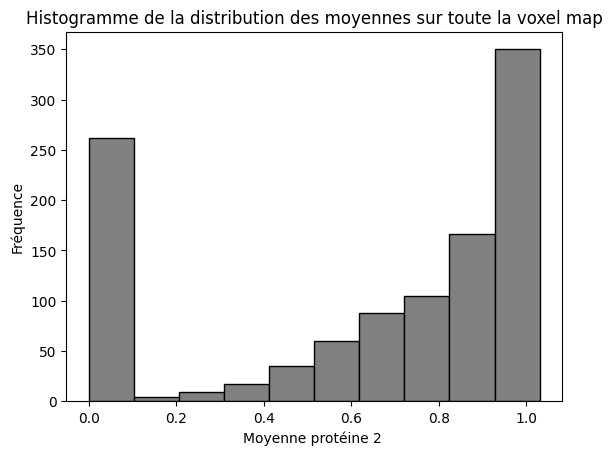

In [44]:
plt.hist(moyenne_2, bins=10, color='grey', edgecolor='black')
plt.xlabel('Moyenne protéine 2 ')
plt.ylabel('Fréquence')
plt.title('Histogramme de la distribution des moyennes sur toute la voxel map')

In [45]:
voxel_25_2, voxel_25_75_2, voxel_75_2,index_inf_25_2,index_inter_25_75_2,index_sup_75_2 = sous_voxel(moyenne_2, quantiles_fusion, l_index_2, voxel_size, df2)


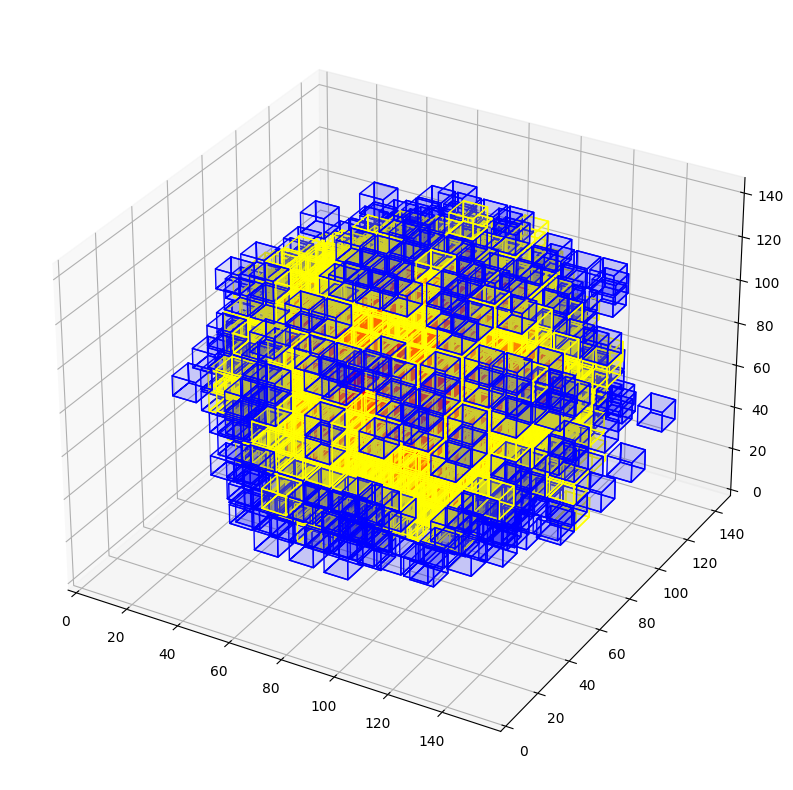

In [46]:
c1_2,c2_2,c3_2=afficher_ssvoxel_col(voxel_25_2, voxel_25_75_2, voxel_75_2, df2)

### 1er quantile

In [47]:
n_25_2=[]
for i in range(len(index_inf_25_2)):
    n_25_2.append(len(q_2[moyenne_2.index(moyenne_2[index_inf_25_2[i]])]))

Text(0.5, 1.0, 'Histogramme de la distribution du nombre de point dans les voxels à faible orientation')

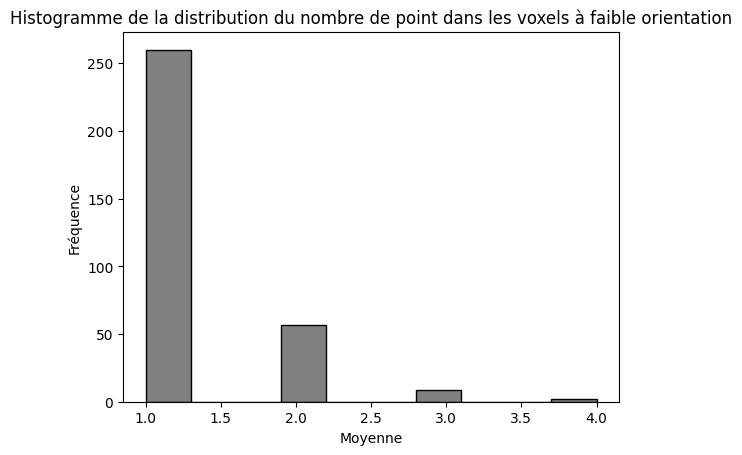

In [48]:
plt.hist(n_25_2, bins=10, color='grey', edgecolor='black')
plt.xlabel('Moyenne')
plt.ylabel('Fréquence')
plt.title('Histogramme de la distribution du nombre de point dans les voxels à faible orientation')

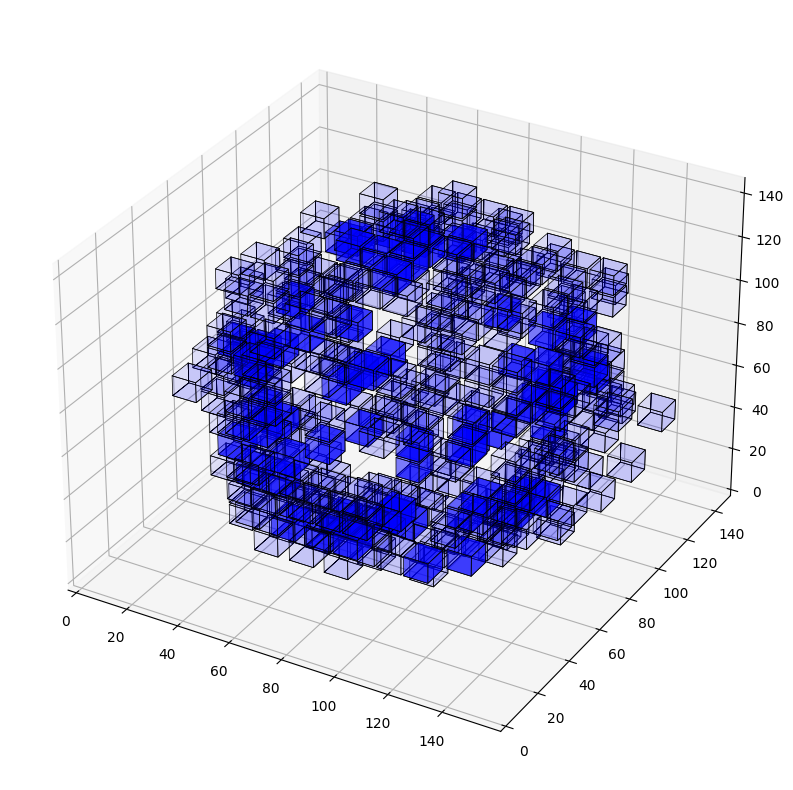

In [49]:
dim1,dim2,dim3=dim_voxel(df2)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
k=0
for cube_condition in c1_2:
    
    draw_cube_orientation(ax, cube_init+cube_condition,n_25_2,'black','blue',k,1.01,3.01)
    k+=1

    
ax.set_xlim([0, dim1*2])
ax.set_ylim([0, dim2*2])
ax.set_zlim([0, dim3*2])
fig.set_size_inches(10, 10) 

# Afficher la figure
plt.show()  

### 2ème quantile

In [50]:
n_25_75_2=[]
for i in range(len(index_inter_25_75_2)):
    n_25_75_2.append(len(q_2[moyenne_2.index(moyenne_2[index_inter_25_75_2[i]])]))

Text(0.5, 1.0, 'Histogramme de la distribution du nombre de point dans les voxels à moyenne orientation')

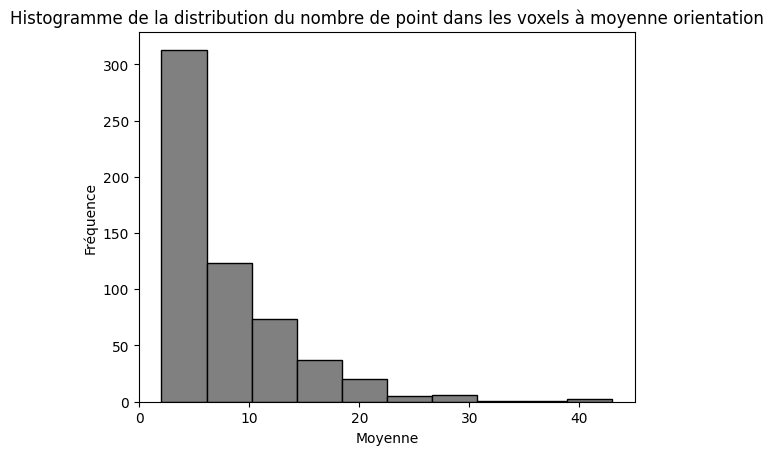

In [51]:
plt.hist(n_25_75_2, bins=10, color='grey', edgecolor='black')
plt.xlabel('Moyenne')
plt.ylabel('Fréquence')
plt.title('Histogramme de la distribution du nombre de point dans les voxels à moyenne orientation')

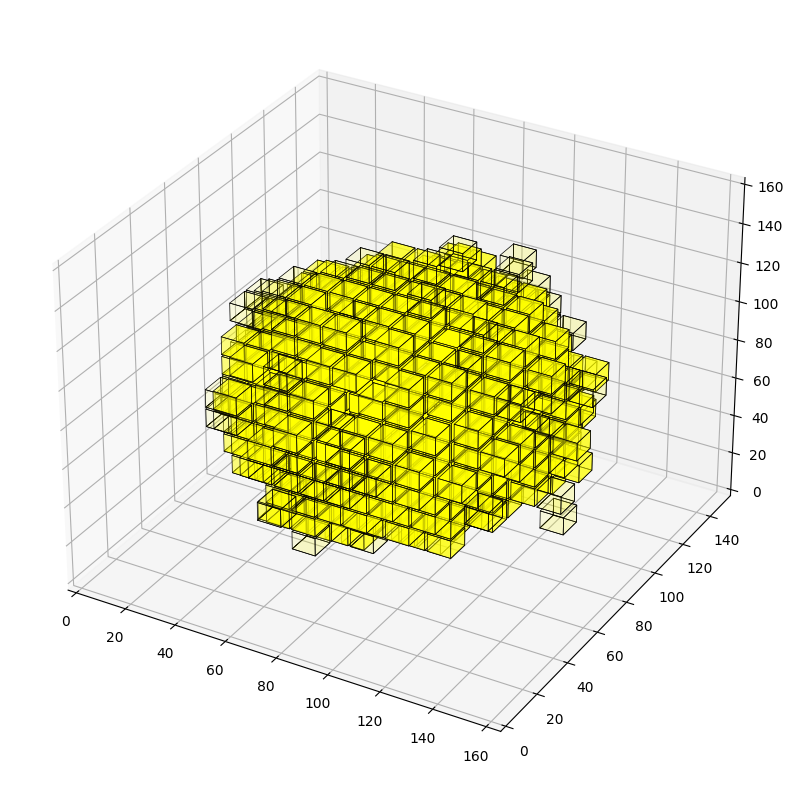

In [52]:
dim1,dim2,dim3=dim_voxel(df)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
k=0

quant1 = np.percentile(n_25_75_2, [25, 50, 75])[0]
quant3=np.percentile(n_25_75_2, [25, 50, 75])[2]
for cube_condition in c2_2:
    
    draw_cube_orientation(ax, cube_init+cube_condition,n_25_75_2,'black','yellow',k,quant1,quant3)
    k+=1

    
ax.set_xlim([0, dim1*2])
ax.set_ylim([0, dim2*2])
ax.set_zlim([0, dim3*2])
fig.set_size_inches(10, 10) 

# Afficher la figure
plt.show()  

### 3ème quantile 

In [53]:
n_75_2=[]
for i in range(len(index_sup_75_2)):
    n_75_2.append(len(q_2[moyenne_2.index(moyenne_2[index_sup_75_2[i]])]))

Text(0.5, 1.0, 'Histogramme de la distribution du nombre de point dans les voxels à grande orientation')

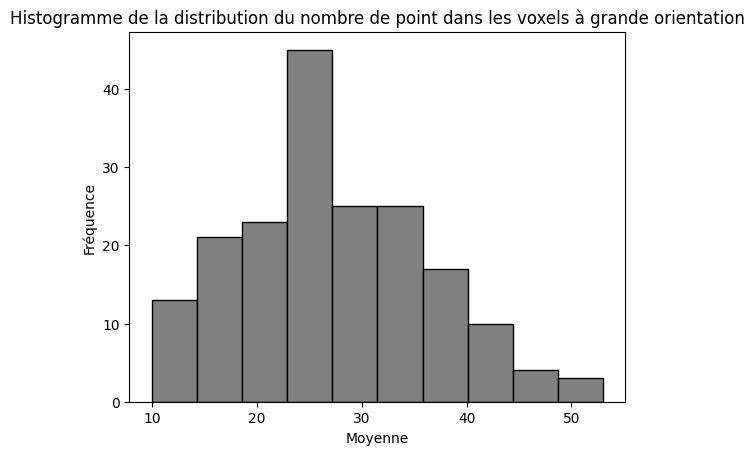

In [54]:
plt.hist(n_75_2, bins=10, color='grey', edgecolor='black')
plt.xlabel('Moyenne')
plt.ylabel('Fréquence')
plt.title('Histogramme de la distribution du nombre de point dans les voxels à grande orientation')

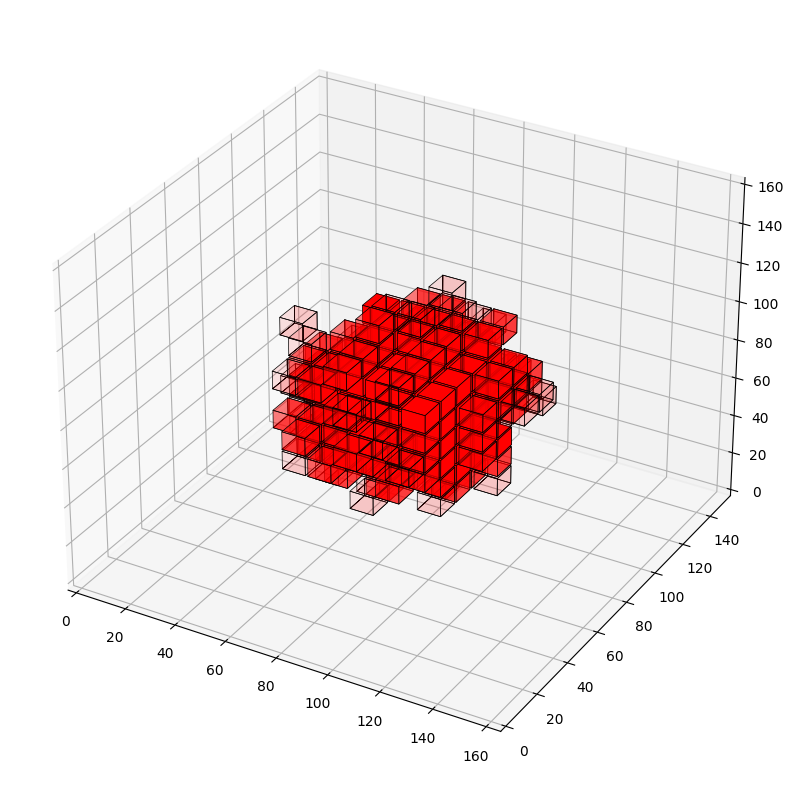

In [55]:
dim1,dim2,dim3=dim_voxel(df)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
k=0

quant1 = np.percentile(n_75_2, [25, 50, 75])[0]
quant3=np.percentile(n_75_2, [25, 50, 75])[2]
for cube_condition in c3_2:
    
    draw_cube_orientation(ax, cube_init+cube_condition,n_75_2,'black','red',k,quant1,quant3)
    k+=1

    
ax.set_xlim([0, dim1*2])
ax.set_ylim([0, dim2*2])
ax.set_zlim([0, dim3*2])
fig.set_size_inches(10, 10) 

# Afficher la figure
plt.show()  

# Comparaison 

In [56]:
len(voxel_1)

1251

In [57]:
len(voxel_2)

1096

In [58]:
print("La première protéine a ", sum(n_25_1)/100 , "% de points contenus dans des voxels à faible orientation contre ", sum(n_25_2)/100, "% pour la seconde protéine")

La première protéine a  5.1 % de points contenus dans des voxels à faible orientation contre  4.09 % pour la seconde protéine


In [59]:
sum(n_25_1)/10000

0.051

In [60]:
sum(n_25_2)/10000

0.0409

In [61]:
print("La première protéine a ", sum(n_25_75_1)/100 , "% de points contenus dans des voxels à moyenne orientation contre ", sum(n_25_75_2)/100, "% pour la seconde protéine")

La première protéine a  48.81 % de points contenus dans des voxels à moyenne orientation contre  45.2 % pour la seconde protéine


In [62]:
sum(n_25_75_1)/10000

0.4881

In [63]:
sum(n_25_75_2)/10000

0.452

In [64]:
print("La première protéine a ", sum(n_75_1)/100 , "% de points contenus dans des voxels à grande orientation contre ", sum(n_75_2)/100, "% pour la seconde protéine")

La première protéine a  46.09 % de points contenus dans des voxels à grande orientation contre  50.71 % pour la seconde protéine


In [65]:
sum(n_75_1)/10000

0.4609

In [66]:
sum(n_75_2)/10000

0.5071

In [67]:
c11,c12,c13=ss_ss_voxel(voxel_25_1,n_25_1,1.01,3.01)

In [68]:
q1=np.percentile(n_25_75_1, [25, 50, 75])[0]
q3=np.percentile(n_25_75_1, [25, 50, 75])[2]
c21,c22,c23=ss_ss_voxel(voxel_25_75_1,n_25_75_1,q1,q3)

In [69]:
q1=np.percentile(n_75_1, [25, 50, 75])[0]
q3=np.percentile(n_75_1, [25, 50, 75])[2]
c31,c32,c33=ss_ss_voxel(voxel_75_1,n_75_1,q1,q3)

In [83]:

c11_2,c12_2,c13_2=ss_ss_voxel(voxel_25_2,n_25_2,1.01,3.01)

In [84]:
q1=np.percentile(n_25_75_2, [25, 50, 75])[0]
q3=np.percentile(n_25_75_2, [25, 50, 75])[2]
c21_2,c22_2,c23_2=ss_ss_voxel(voxel_25_75_2,n_25_75_2,q1,q3)

In [85]:
q1=np.percentile(n_75_2, [25, 50, 75])[0]
q3=np.percentile(n_75_2, [25, 50, 75])[2]
c31_2,c32_2,c33_2=ss_ss_voxel(voxel_75_2,n_75_2,q1,q3)

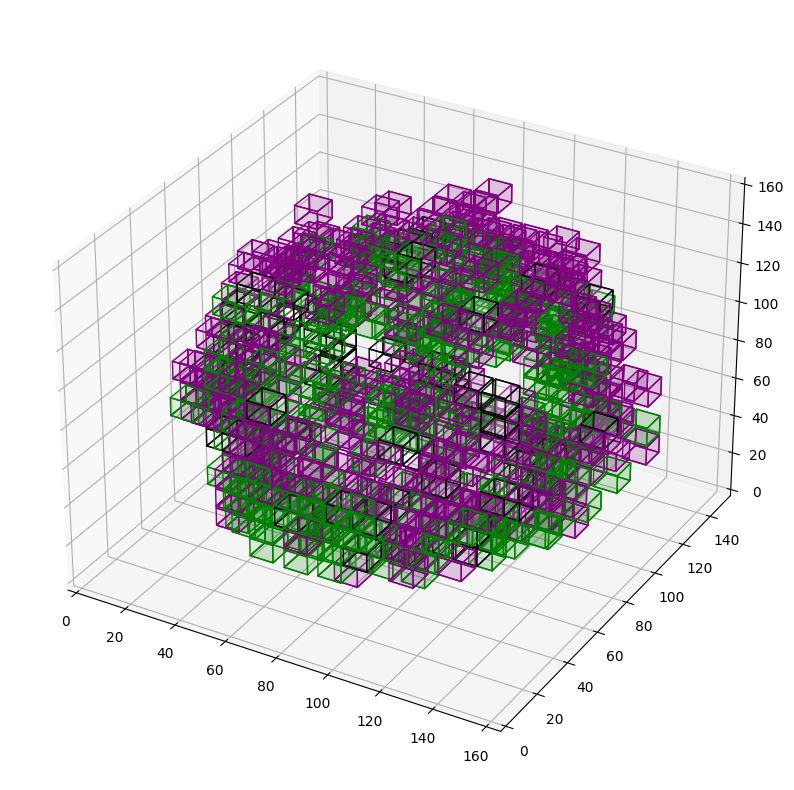

In [86]:
aff_diff(c11,c11_2)

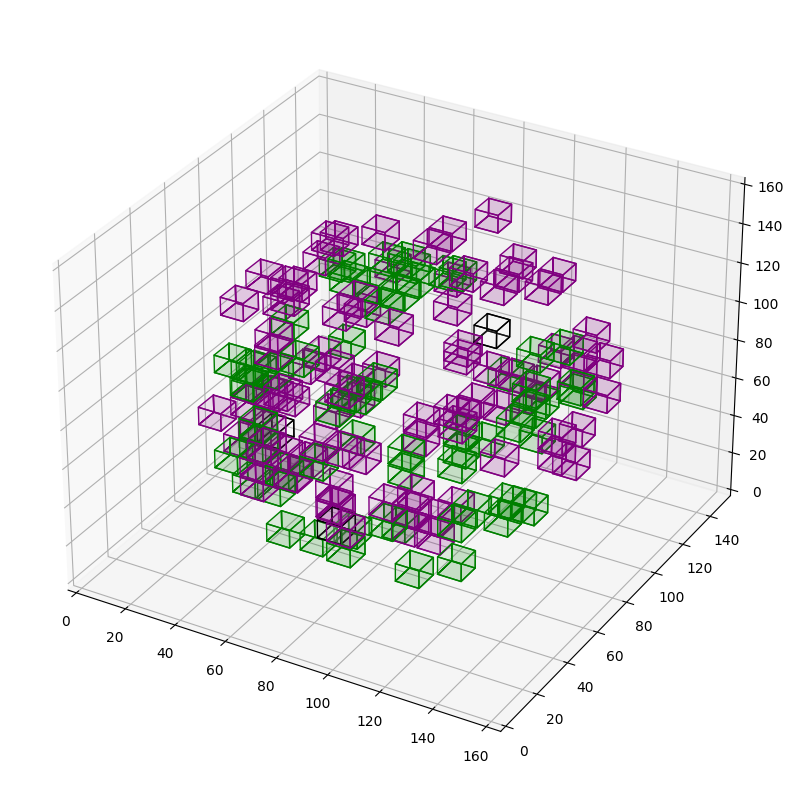

In [87]:
aff_diff(c12,c12_2)

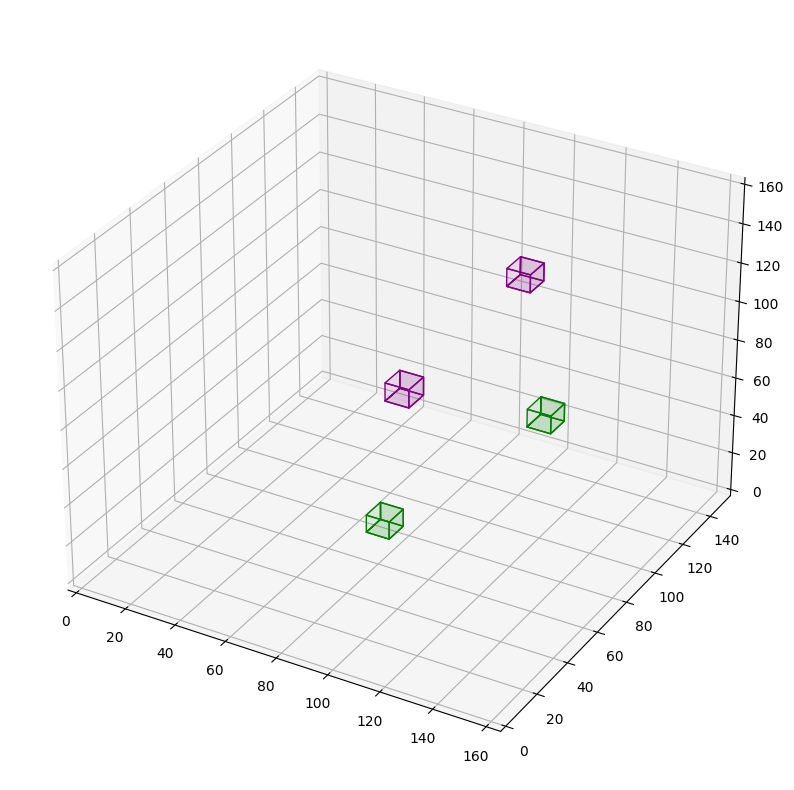

In [88]:
aff_diff(c13,c13_2)

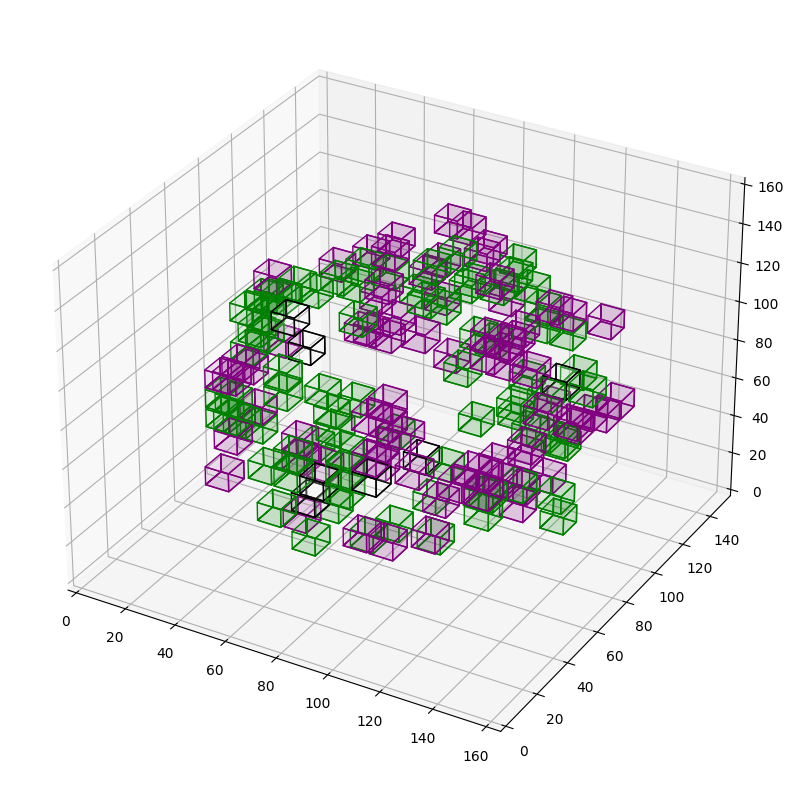

In [89]:
aff_diff(c21,c21_2)

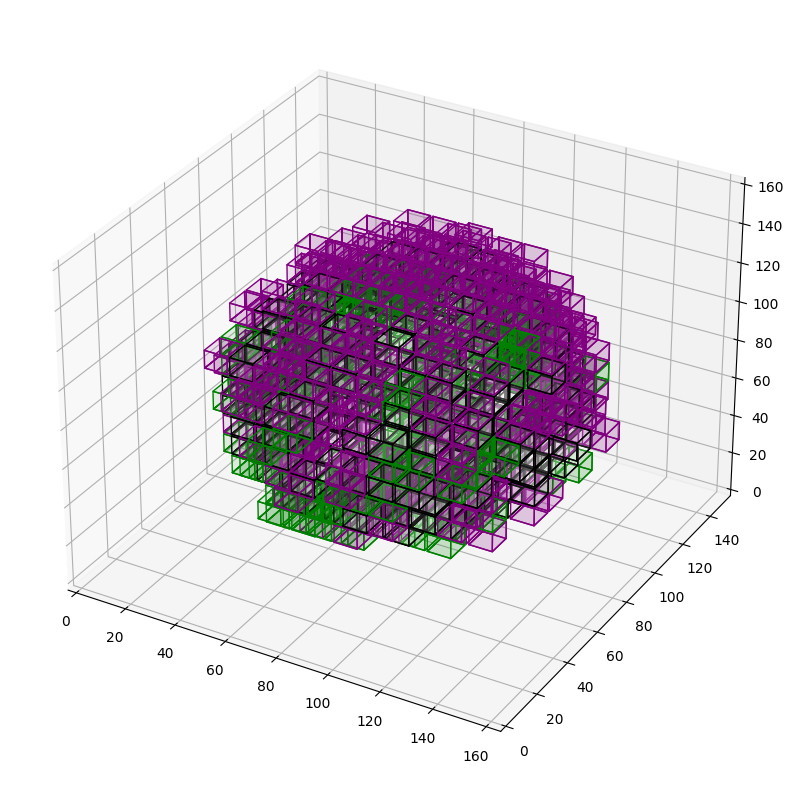

In [90]:
aff_diff(c22,c22_2)

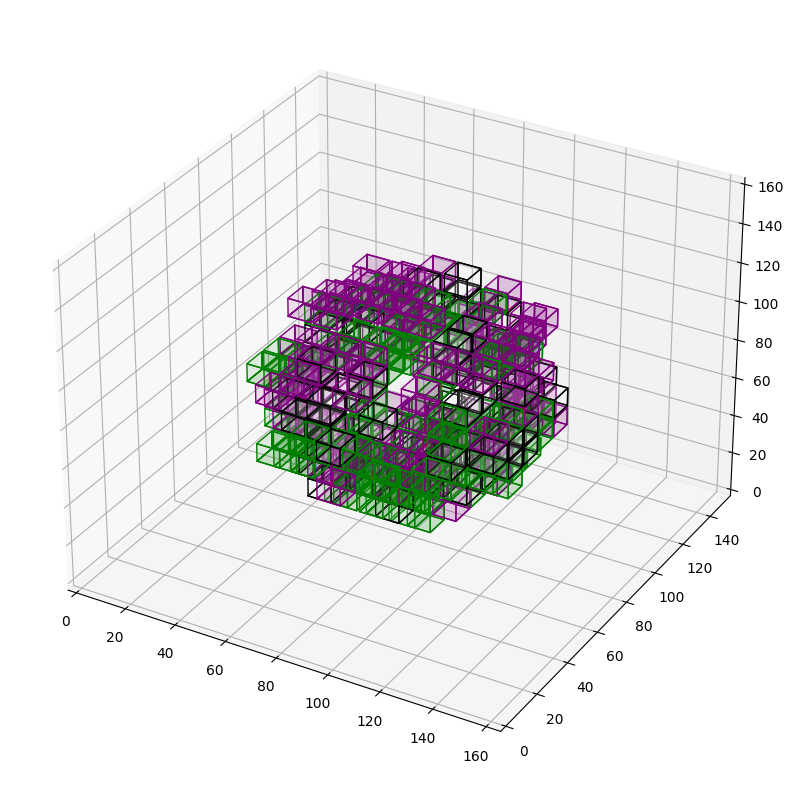

In [91]:
aff_diff(c23,c23_2)

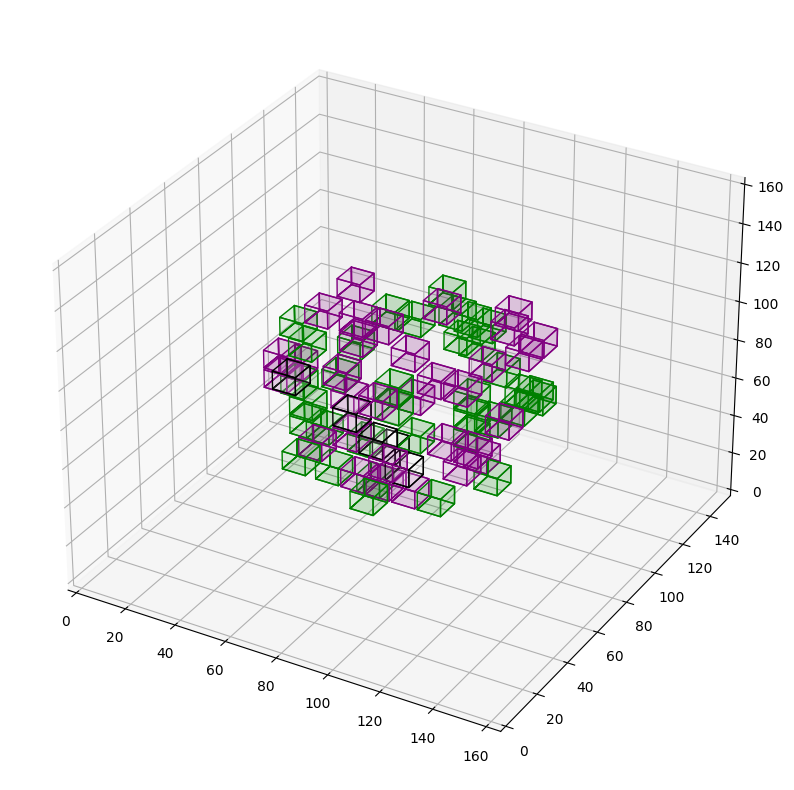

In [92]:
aff_diff(c31,c31_2)

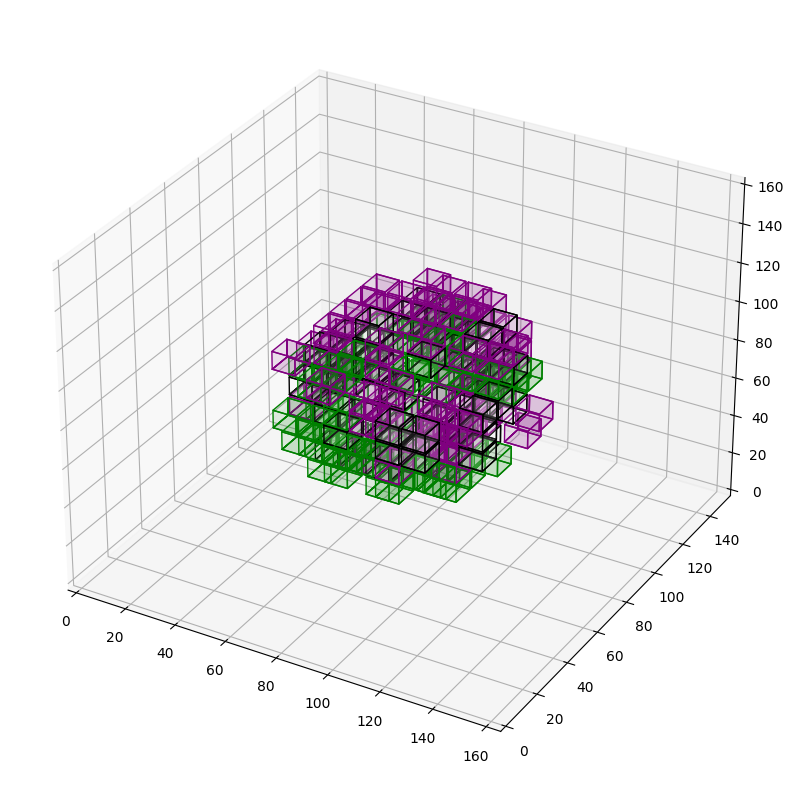

In [93]:
aff_diff(c32,c32_2)

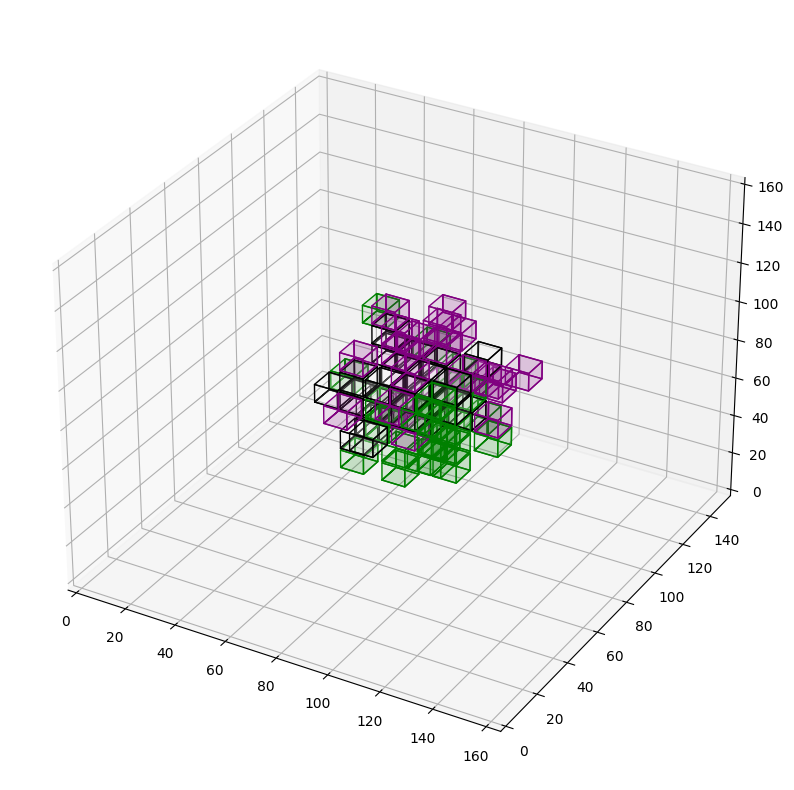

In [94]:
aff_diff(c33,c33_2)